# **CLUSTERING**

# Pandas Profiling

In [2]:
# load sample dataset
import pandas as pd
import numpy as np
import ydata_profiling as pp 

wine = pd.read_csv('wine_dataset.csv').drop(columns=['quality', 'type'])
wine = wine.astype(np.float64)
profile = pp.ProfileReport(wine, title="Wine Dataset Report", explorative=True)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 11/11 [00:00<00:00, 74.55it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
from sklearn.feature_selection import VarianceThreshold

selector = VarianceThreshold(threshold=0.01)
selector.fit(wine)
low_variance_cols = wine.columns[~selector.get_support()]

In [ ]:
from pycaret.clustering import *

# Initialize the setup
cls1 = setup(wine, ignore_features=['chlorides', 'density'], session_id=3, experiment_name='wine_clustering')

,Description,Value
0,Session id,123
1,Original data shape,"(6497, 11)"
2,Transformed data shape,"(6497, 9)"
3,Ignore features,2
4,Numeric features,9
5,Preprocess,True
6,Imputation type,simple
7,Numeric imputation,mean
8,Categorical imputation,mode
9,CPU Jobs,-1


In [23]:
models()

,Name,Reference
ID,,
kmeans,K-Means Clustering,sklearn.cluster._kmeans.KMeans
ap,Affinity Propagation,sklearn.cluster._affinity_propagation.Affinity...
meanshift,Mean Shift Clustering,sklearn.cluster._mean_shift.MeanShift
sc,Spectral Clustering,sklearn.cluster._spectral.SpectralClustering
hclust,Agglomerative Clustering,sklearn.cluster._agglomerative.AgglomerativeCl...
dbscan,Density-Based Spatial Clustering,sklearn.cluster._dbscan.DBSCAN
optics,OPTICS Clustering,sklearn.cluster._optics.OPTICS
birch,Birch Clustering,sklearn.cluster._birch.Birch
kmodes,K-Modes Clustering,kmodes.kmodes.KModes


In [ ]:
kmodes = create_model('kmodes', num_clusters=4)
kmeans_results = assign_model(kmeans)

# Analyze Model

In [27]:
plot_model(kmeans)

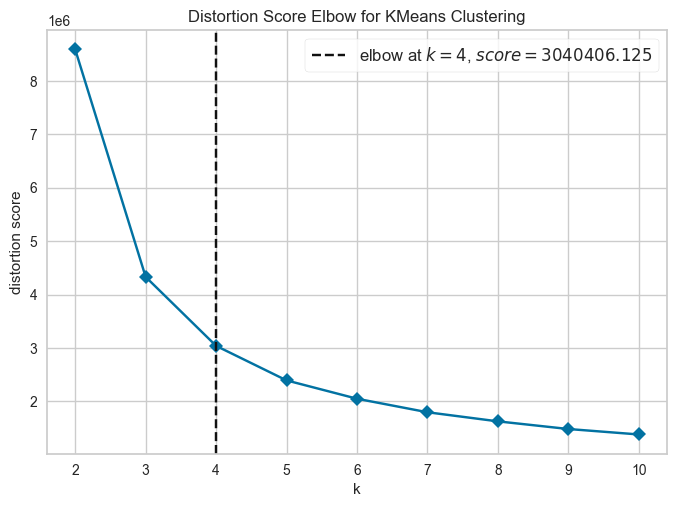

In [30]:
plot_model(kmeans, plot = 'elbow')

In [33]:
plot_model(kmeans, plot = 'distribution')

# Save Model

In [39]:
save_model(kmeans, model_name='best_model_clustering')

Transformation Pipeline and Model Successfully Saved


(Pipeline(memory=Memory(location=None),
          steps=[('numerical_imputer',
                  TransformerWrapper(include=['fixed acidity',
                                              'volatile acidity', 'citric acid',
                                              'residual sugar', 'chlorides',
                                              'free sulfur dioxide',
                                              'total sulfur dioxide', 'density',
                                              'pH', 'sulphates', 'alcohol'],
                                     transformer=SimpleImputer())),
                 ('categorical_imputer',
                  TransformerWrapper(include=[],
                                     transformer=SimpleImputer(strategy='most_frequent'))),
                 ('trained_model', KMeans(n_clusters=4, random_state=123))]),
 'best_model_clustering.pkl')

Note : 

Setelah dilakukan beberapa tahapan sebelumnya, kemudian model akan disimpan ke dalam file dengan format .pkl

# Load Model

In [41]:
load_best = load_model('best_model_classification')
print(load_best)

Transformation Pipeline and Model Successfully Loaded
Pipeline(memory=FastMemory(location=/tmp/joblib),
         steps=[('numerical_imputer',
                 TransformerWrapper(include=['age', 'menopause', 'tumor-size',
                                             'inv-nodes', 'node-caps',
                                             'deg-malig', 'breast',
                                             'breast-quad', 'irradiat'],
                                    transformer=SimpleImputer())),
                ('categorical_imputer',
                 TransformerWrapper(include=[],
                                    transformer=SimpleImputer(strategy='most_frequent'))),
                ('clean_column_names',
                 TransformerWrapper(transformer=CleanColumnNames())),
                ('trained_model',
                 ExtraTreesClassifier(bootstrap=True, class_weight='balanced',
                                      criterion='entropy', max_depth=7,
                           